# <center> **Titanic Survivor Analysis** <center>

---

<center><b>By:</b></center>
<p></p>

<center><b>Kevin Jonathan Rotty<b></center>


---

# **Deskripsi Dataset**

**Dataset Titanic ini berisi informasi detail mengenai penumpang kapal Titanic yang tenggelam pada tahun 1912. Setiap baris merepresentasikan satu penumpang dan mencakup informasi seperti PassengerId, Pclass (kelas sosial), Name, Sex, Age, SibSp (jumlah saudara/spouse), Parch (jumlah orang tua/anak), Ticket, Fare (tarif tiket), Cabin, dan Embarked (pelabuhan keberangkatan). Kolom utama dalam dataset ini adalah Survived, yang bernilai 1 jika penumpang selamat, dan 0 jika tidak.**

# **Tujuan Eksplorasi**

**Tujuan dari analisis ini adalah untuk mengidentifikasi kelompok penumpang seperti apa yang paling banyak selamat dalam tragedi Titanic. Dengan melakukan eksplorasi data, pembersihan, dan visualisasi, kita akan mengevaluasi distribusi keselamatan berdasarkan berbagai kategori seperti jenis kelamin, usia, kelas penumpang, serta keberadaan keluarga di kapal. Hasil akhir akan menyajikan insight berupa pengelompokan fitur-fitur berdasarkan rata-rata nilai Survived, sebagai dasar untuk menyimpulkan siapa saja yang paling banyak selamat.**

# **1. Mempersiapkan seluruh library yang akan digunakan dan load dataset**

In [1]:
!pip install ydata_profiling
!pip install autoviz
!pip install missingno

In [9]:
# Manipulasi dataframe dan perhitungan numerik
import pandas as pd
import numpy as np

# Visualisasi statik dan statistik
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Visualisasi missing value
import missingno as msno
%matplotlib inline

# Statistik
from scipy.stats import shapiro

# Visualisasi interaktif
import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'colab'
%matplotlib inline

# Laporan eksplorasi otomatis
from ydata_profiling import ProfileReport
from autoviz.AutoViz_Class import AutoViz_Class

In [3]:
df = pd.read_csv('Titanic-Dataset.csv')

In [4]:
df

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C


# **2. Eksplorasi beserta visualisasi**

**Melihat struktur dataset**

In [5]:

print("Ukuran data:", df.shape)
print("\nTipe data tiap kolom:")
print(df.dtypes)
print("\nInformasi lengkap:")
df.info()

Ukuran data: (891, 12)

Tipe data tiap kolom:
PassengerId      int64
Survived         int64
Pclass           int64
Name            object
Sex             object
Age            float64
SibSp            int64
Parch            int64
Ticket          object
Fare           float64
Cabin           object
Embarked        object
dtype: object

Informasi lengkap:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    o

**Melihat deskripsi statistik dataset**

In [6]:
df.describe(include='all')

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
count,891.000000,891.000000,891.000000,891,891,714.000000,891.000000,891.000000,891,891.000000,204,889
unique,NaN,NaN,NaN,891,2,NaN,NaN,NaN,681,NaN,147,3
top,NaN,NaN,NaN,"Braund, Mr. Owen Harris",male,NaN,NaN,NaN,347082,NaN,B96 B98,S
freq,NaN,NaN,NaN,1,577,NaN,NaN,NaN,7,NaN,4,644
mean,446.000000,0.383838,2.308642,NaN,NaN,29.699118,0.523008,0.381594,NaN,32.204208,NaN,NaN
std,257.353842,0.486592,0.836071,NaN,NaN,14.526497,1.102743,0.806057,NaN,49.693429,NaN,NaN
min,1.000000,0.000000,1.000000,NaN,NaN,0.420000,0.000000,0.000000,NaN,0.000000,NaN,NaN
25%,223.500000,0.000000,2.000000,NaN,NaN,20.125000,0.000000,0.000000,NaN,7.910400,NaN,NaN
50%,446.000000,0.000000,3.000000,NaN,NaN,28.000000,0.000000,0.000000,NaN,14.454200,NaN,NaN
75%,668.500000,1.000000,3.000000,NaN,NaN,38.000000,1.000000,0.000000,NaN,31.000000,NaN,NaN


**Cek missing value**

In [7]:
print("Jumlah missing value per kolom:")
print(df.isnull().sum())

Jumlah missing value per kolom:
PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64


**Visualisasi missing value**

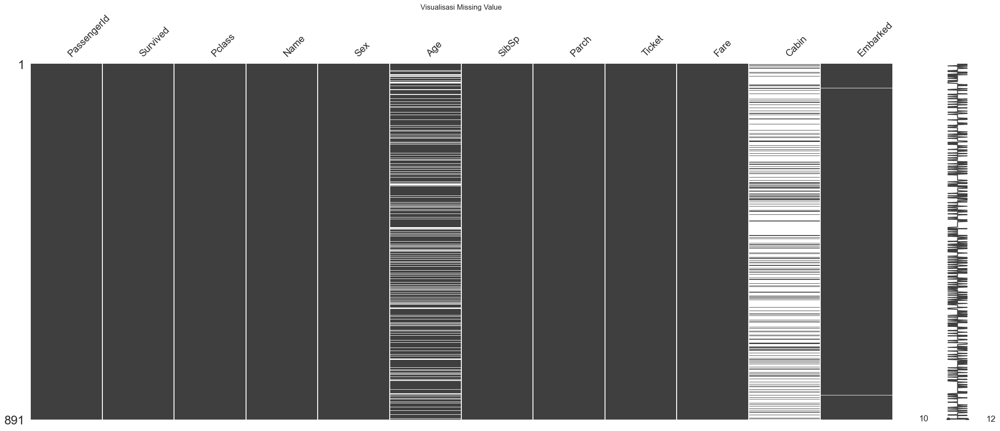

In [11]:
msno.matrix(df)
plt.title("Visualisasi Missing Value")
plt.show()

**Penanganan missing value**

In [12]:
df['Embarked'].fillna(df['Embarked'].mode()[0], inplace=True)

karena kolom embarked merupakan kategorikal, maka missing value akan diisi dengan nilai modus yang tidak akan mempengaruhi distribusi data

In [13]:
df.drop('Cabin', axis=1, inplace=True)

kolom cabin akan dihapus karena lebih dari 70% data tidak diketahui informasinya, sehingga tidak relevan untuk kita jadikan insight nantinya

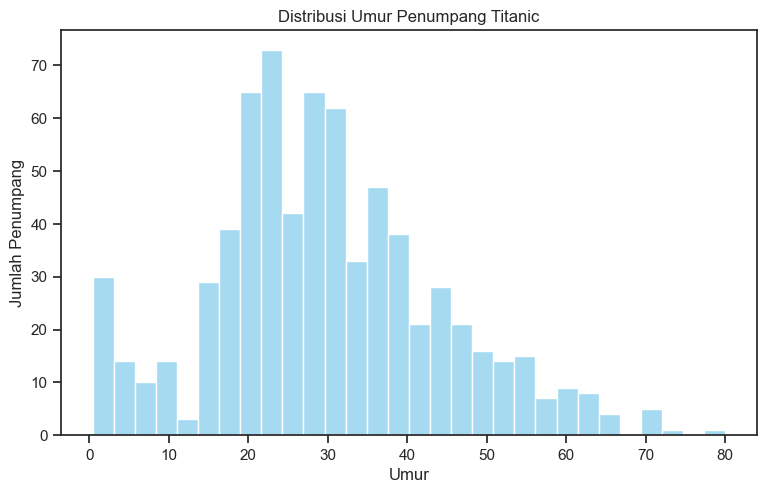

In [14]:
plt.figure(figsize=(8, 5))
sns.histplot(df['Age'], bins=30, kde=False, color='skyblue')
plt.title("Distribusi Umur Penumpang Titanic")
plt.xlabel("Umur")
plt.ylabel("Jumlah Penumpang")
plt.show()

In [15]:
# uji statisktik distribusi age
age_no_na = df['Age'].dropna()
stat, p = shapiro(age_no_na)
print('Statistik Uji:', stat)
print('p-value:', p)

Statistik Uji: 0.9814577414504957
p-value: 7.337348958675466e-08


berdasarkan uji statistik di atas, kolom age berdistribusi tidak normal (p-value < 0,05), maka missing value akan diisi dengan median yang lebih tahan terhadap outlier dan nilai bias

In [16]:
df['Age'].fillna(df['Age'].median(), inplace=True)

In [17]:
print(df.isnull().sum())

PassengerId    0
Survived       0
Pclass         0
Name           0
Sex            0
Age            0
SibSp          0
Parch          0
Ticket         0
Fare           0
Embarked       0
dtype: int64


**Cek nilai duplikat**

In [18]:
print("Duplikat:", df.duplicated().sum())

Duplikat: 0


**Deteksi Outlier**

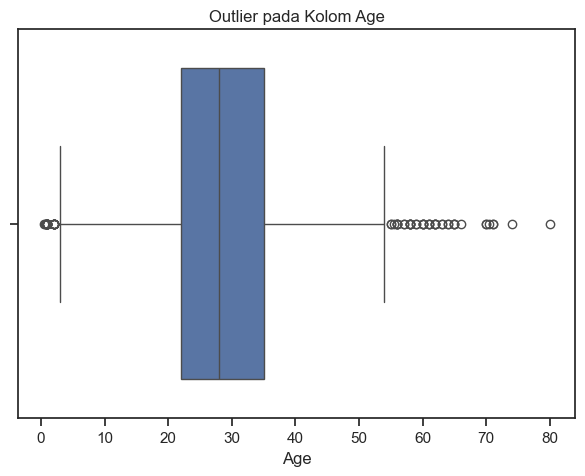

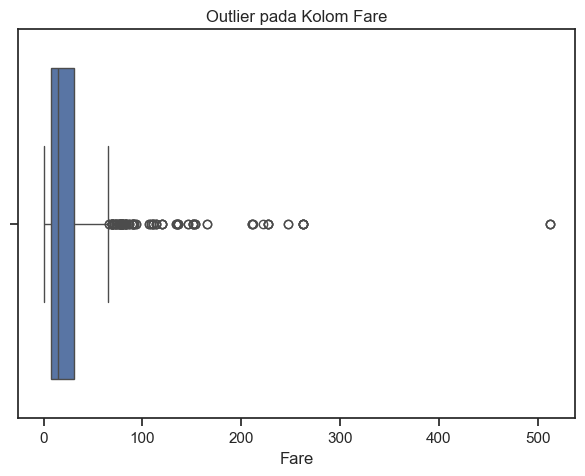

In [19]:
# hanya pada kolom numerik kontinyu
sns.boxplot(x=df['Age'])
plt.title("Outlier pada Kolom Age")
plt.show()

sns.boxplot(x=df['Fare'])
plt.title("Outlier pada Kolom Fare")
plt.show()

In [20]:
Q1 = df['Age'].quantile(0.25)
Q3 = df['Age'].quantile(0.75)
IQR = Q3 - Q1

batas_bawah = Q1 - 1.5 * IQR
batas_atas = Q3 + 1.5 * IQR

outlier_age = df[(df['Age'] < batas_bawah) | (df['Age'] > batas_atas)]
print("Jumlah outlier Age:", len(outlier_age))
print(outlier_age[['PassengerId', 'Age', 'Survived']])

Jumlah outlier Age: 66
     PassengerId   Age   Survived
7          8       2.00      0   
11        12      58.00      1   
15        16      55.00      1   
16        17       2.00      0   
33        34      66.00      0   
54        55      65.00      0   
78        79       0.83      1   
94        95      59.00      0   
96        97      71.00      0   
116      117      70.50      0   
119      120       2.00      0   
152      153      55.50      0   
164      165       1.00      0   
170      171      61.00      0   
172      173       1.00      1   
174      175      56.00      0   
183      184       1.00      1   
195      196      58.00      1   
205      206       2.00      0   
232      233      59.00      0   
252      253      62.00      0   
268      269      58.00      1   
275      276      63.00      1   
280      281      65.00      0   
297      298       2.00      0   
305      306       0.92      1   
326      327      61.00      0   
340      341       2.00  

In [21]:
Q1_f = df['Fare'].quantile(0.25)
Q3_f = df['Fare'].quantile(0.75)
IQR_f = Q3_f - Q1_f

bawah_f = Q1_f - 1.5 * IQR_f
atas_f = Q3_f + 1.5 * IQR_f

outlier_fare = df[(df['Fare'] < bawah_f) | (df['Fare'] > atas_f)]
print("Jumlah outlier Fare:", len(outlier_fare))
print(outlier_fare[['PassengerId', 'Fare', 'Survived']])

Jumlah outlier Fare: 116
     PassengerId    Fare    Survived
1          2       71.2833      1   
27        28      263.0000      0   
31        32      146.5208      1   
34        35       82.1708      0   
52        53       76.7292      1   
61        62       80.0000      1   
62        63       83.4750      0   
72        73       73.5000      0   
88        89      263.0000      1   
102      103       77.2875      0   
118      119      247.5208      0   
120      121       73.5000      0   
124      125       77.2875      0   
139      140       79.2000      0   
151      152       66.6000      1   
159      160       69.5500      0   
180      181       69.5500      0   
195      196      146.5208      1   
201      202       69.5500      0   
215      216      113.2750      1   
218      219       76.2917      1   
224      225       90.0000      1   
230      231       83.4750      1   
245      246       90.0000      0   
256      257       79.2000      1   
257      258 

outlier ini tidak akan ditindaklanjuti dan akan tetap dibiarkan dalam dataset, karena tujuan eksplorasi ini untuk mendapatkan insight karakteristik penumpang yang selamat, sehingga nilai-nilai outlier ini bisa jadi akan memberikan informasi tambahan yang penting

**Korelasi antar variabel**

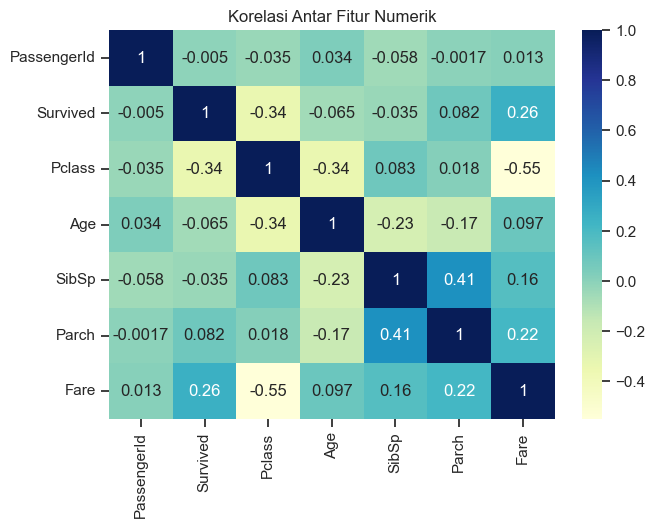

In [22]:
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap='YlGnBu')
plt.title("Korelasi Antar Fitur Numerik")
plt.show()

**Variabel yang bisa bermanfaat untuk fitur kita berdasarkan nilai korelasi di atas antara lain:**
1. Pclass
2. Fare
3. Parch
4. SibSp

**distribusi penumpang selamat**

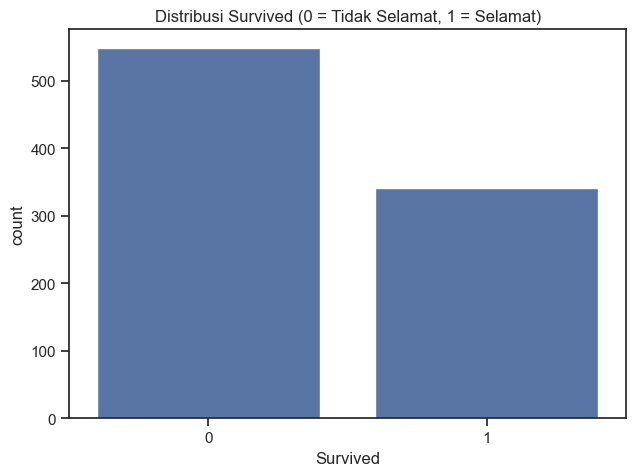

Survived
0    61.616162
1    38.383838
Name: proportion, dtype: float64


In [23]:
# Hitung jumlah yang selamat dan tidak
sns.countplot(x='Survived', data=df)
plt.title("Distribusi Survived (0 = Tidak Selamat, 1 = Selamat)")
plt.show()

# Persentase selamat
survival_rate = df['Survived'].value_counts(normalize=True) * 100
print(survival_rate)

**Insight yang didapatkan dari bagian ini adalah,** ternyata lebih banyak penumpang titanic yang tidak selamat saat kapalnya tenggelam

# **3. Karakteristik penumpang yang selamat (insight utama)**

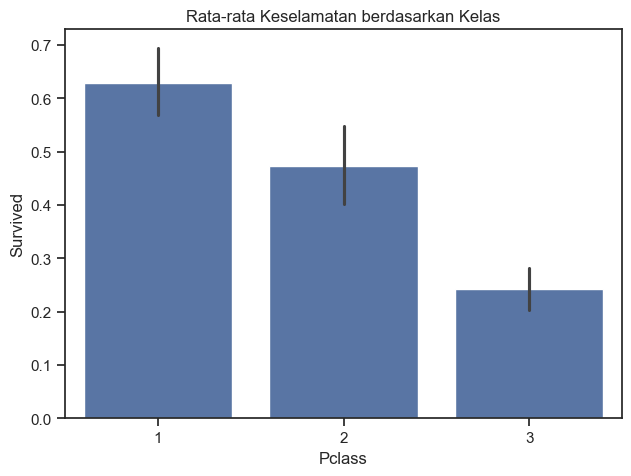

In [24]:
# Barplot proporsi selamat per Pclass
sns.barplot(x='Pclass', y='Survived', data=df)
plt.title('Rata-rata Keselamatan berdasarkan Kelas')
plt.show()

**Karakteristik pertama:**
Penumpang dengan Pclass 1 memiliki tingkat keselamatan > 60%,
Penumpang dengan Pclass 2 memiliki tingkat keselamatan > 40%,
Penumpang dengan Pclass 3 memiliki tingkat keselamatan > 20%

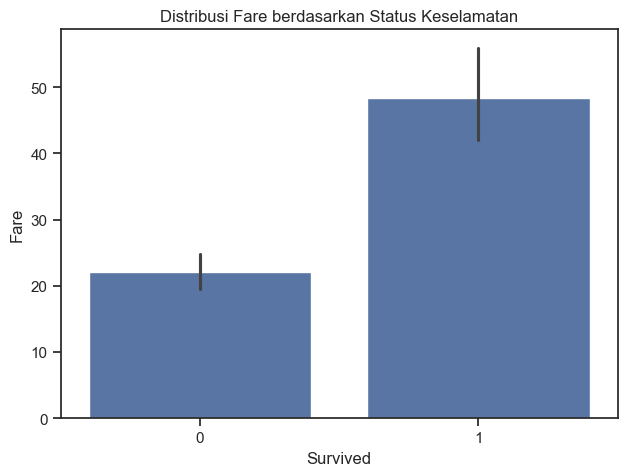

In [25]:
# Distribusi Fare berdasarkan keselamatan
sns.barplot(x='Survived', y='Fare', data=df)
plt.title('Distribusi Fare berdasarkan Status Keselamatan')
plt.show()

**Karakteristik kedua:**
Penumpang yang membayar tarif tiket lebih mahal menunjukkan kemungkinan selamat yang lebih tinggi. Rata-rata `Fare` penumpang yang selamat lebih dari dua kali lipat dibandingkan mereka yang tidak selamat. Hal ini memperkuat hipotesis bahwa faktor kelas sosial (diwakili oleh harga tiket) mempengaruhi akses terhadap keselamatan.

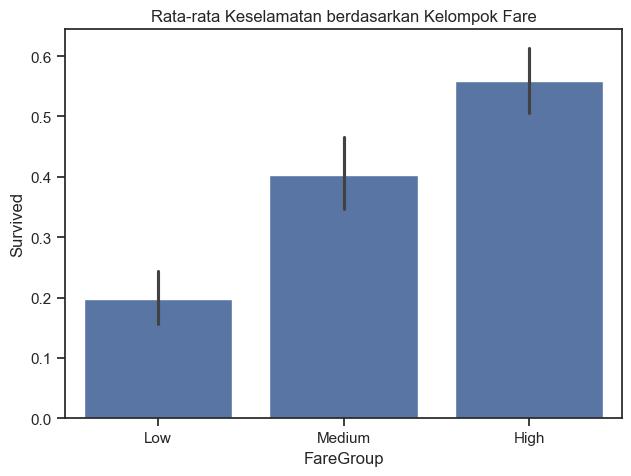

IntervalIndex([(-0.001, 8.662], (8.662, 26.0], (26.0, 512.329]], dtype='interval[float64, right]')


In [26]:
df['FareGroup'] = pd.qcut(df['Fare'], q=3, labels=['Low', 'Medium', 'High'])

# Cek perbandingan selamat per grup Fare
sns.barplot(x='FareGroup', y='Survived', data=df)
plt.title('Rata-rata Keselamatan berdasarkan Kelompok Fare')
plt.show()

fare_bins = pd.qcut(df['Fare'], q=3)
print(fare_bins.cat.categories)

**Karakteristik ketiga:**
Kelompok penumpang yang membayar tarif tiket tinggi (`High Fare`) memiliki rata-rata tingkat keselamatan tertinggi (56%), diikuti oleh `Medium Fare` (40%), dan yang terendah adalah kelompok `Low Fare` (20%). Hal ini menunjukkan hubungan positif antara **kemampuan ekonomi (melalui tarif tiket)** dan **peluang keselamatan**, yang konsisten dengan struktur sosial dan sistem evakuasi pada masa tersebut.

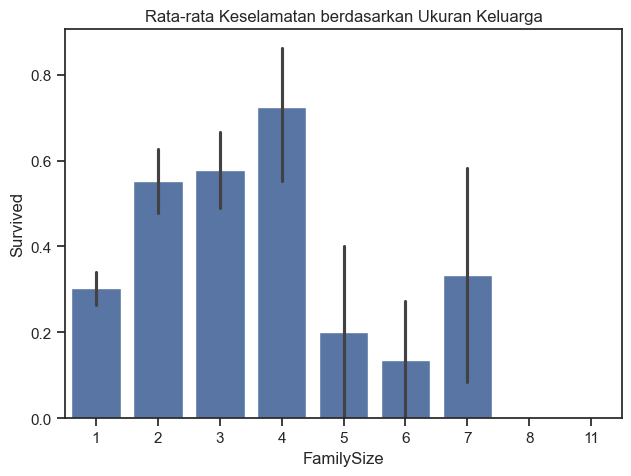

In [27]:
df['FamilySize'] = df['SibSp'] + df['Parch'] + 1

sns.barplot(x='FamilySize', y='Survived', data=df)
plt.title('Rata-rata Keselamatan berdasarkan Ukuran Keluarga')
plt.show()

**Karakteristik keempat:**
Tingkat keselamatan tertinggi tercatat pada penumpang dengan ukuran keluarga 2–4 orang, dengan proporsi selamat >55%. Sebaliknya, penumpang yang bepergian sendiri atau dengan keluarga besar (>4 anggota) menunjukkan kemungkinan selamat lebih rendah (<30%). Hal ini menunjukkan bahwa **struktur keluarga yang moderat mungkin memberikan kombinasi optimal antara dukungan sosial dan fleksibilitas saat evakuasi**.

In [28]:
%pip install nbformat

Note: you may need to restart the kernel to use updated packages.


In [29]:
pio.renderers.default = 'notebook'
fig = px.scatter(df, x="Age", y="Fare", color="Survived",
                 size="Fare", hover_data=['Sex', 'Pclass', 'FamilySize', 'FareGroup'],
                 title="Bubble Plot: Age vs Fare by Survival")
fig.show()

# **4. (Opsional) menggunakan library profiling untuk visualisasi dan analisis otomatis**

In [30]:
profile = ProfileReport(df, title="Titanic Profiling Report", explorative=True)
profile.to_file("ydata_profiling_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:00<00:00, 142738.09it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [31]:
profile.to_notebook_iframe()

Shape of your Data Set loaded: (891, 13)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  2
    Number of Integer-Categorical Columns =  4
    Number of String-Categorical Columns =  1
    Number of Factor-Categorical Columns =  1
    Number of String-Boolean Columns =  1
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  1
    Number of NLP String Columns =  1
    Number of Date Time Columns =  0
    Number of ID Columns =  1
    Number of Columns to Delete =  0
    12 Predictors classified...
        1 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['PassengerId']

################ Binary_Classification problem #####

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Pclass,int64,0.000000,0,1.000000,3.000000,No issue
Name,object,0.000000,100,,,No issue
Sex,object,0.000000,0,,,No issue
Age,float64,0.000000,NA,0.420000,80.000000,Column has 66 outliers greater than upper bound (54.50) or lower than lower bound(2.50). Cap them or remove them.
SibSp,int64,0.000000,0,0.000000,8.000000,Column has 46 outliers greater than upper bound (2.50) or lower than lower bound(-1.50). Cap them or remove them.
Parch,int64,0.000000,0,0.000000,6.000000,Column has 213 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
Ticket,object,0.000000,76,,,Possible high cardinality column with 681 unique values: Use hash encoding or text embedding to reduce dimension.
Fare,float64,0.000000,NA,0.000000,512.329200,Column has 116 outliers greater than upper bound (65.63) or lower than lower bound(-26.72). Cap them or remove them.
Embarked,object,0.000000,0,,,No issue
FareGroup,category,0.000000,0,,,No issue


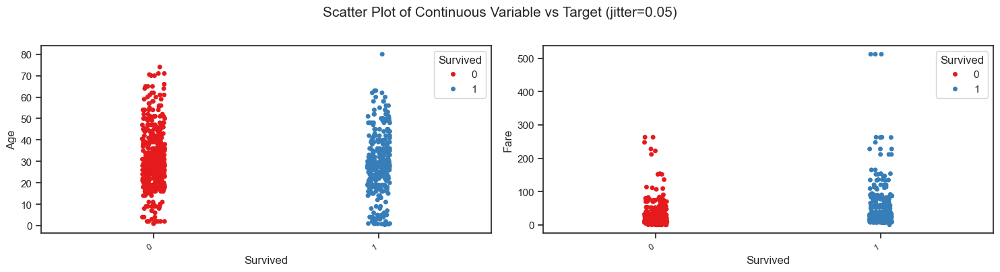

Total Number of Scatter Plots = 3


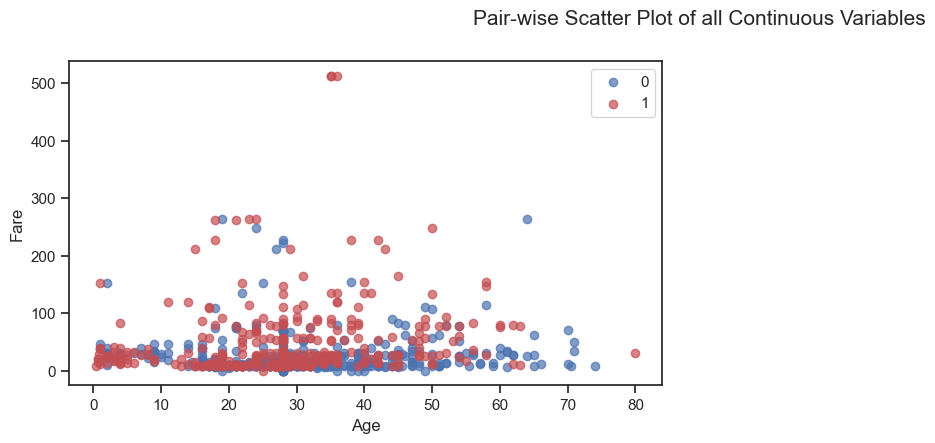

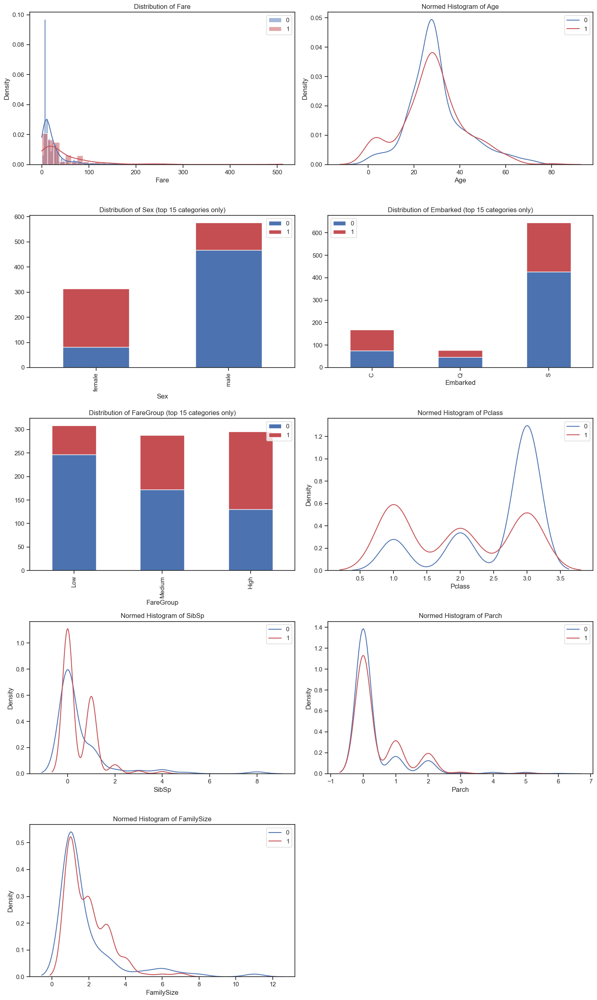

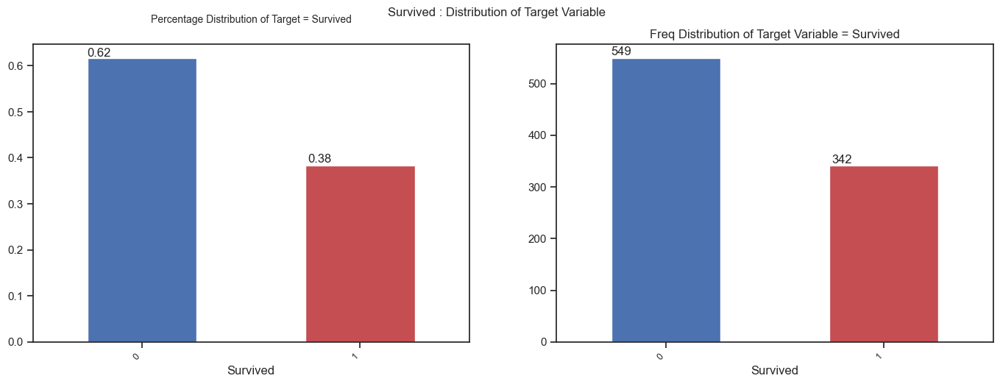

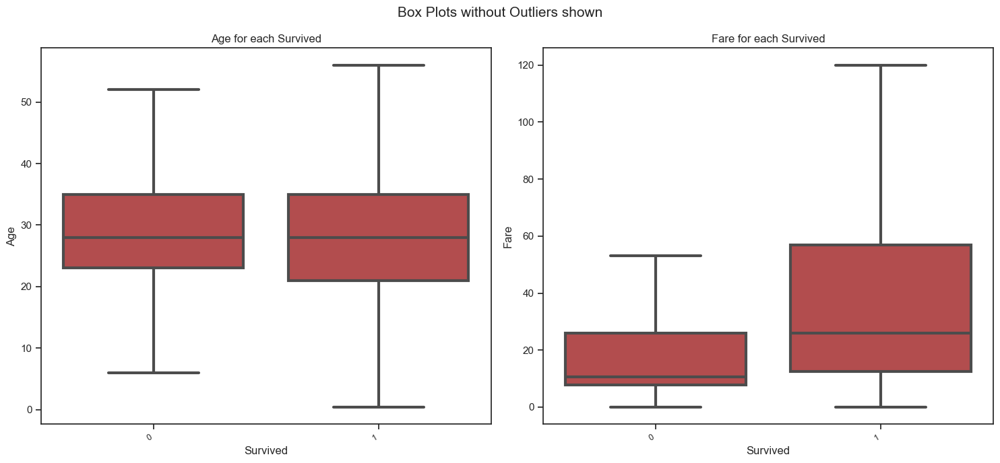

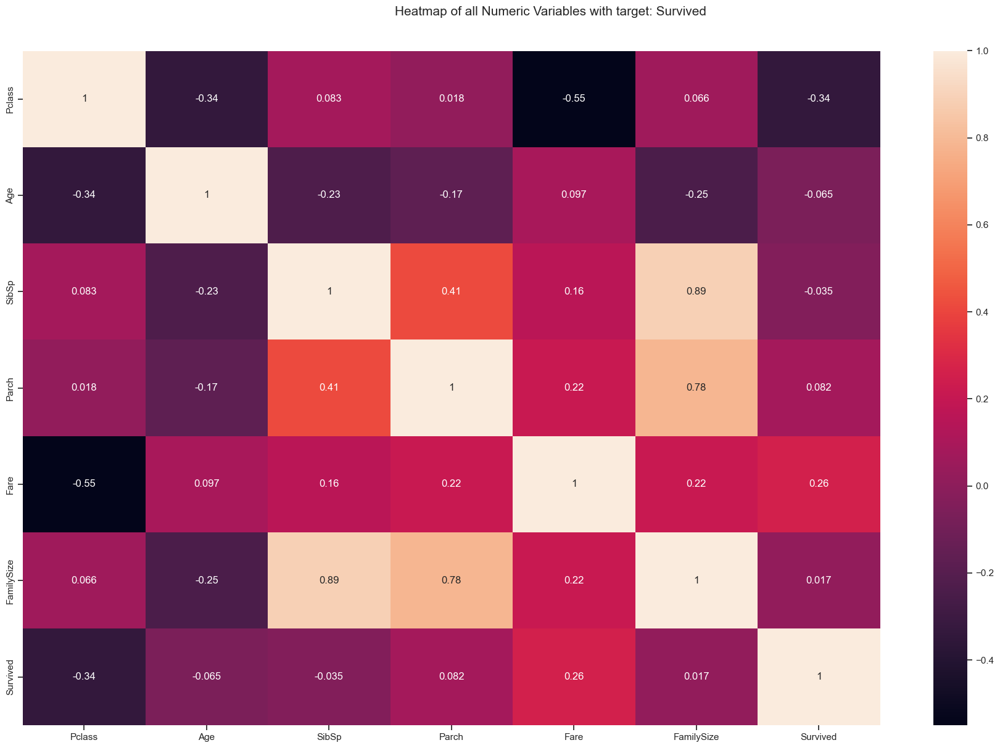

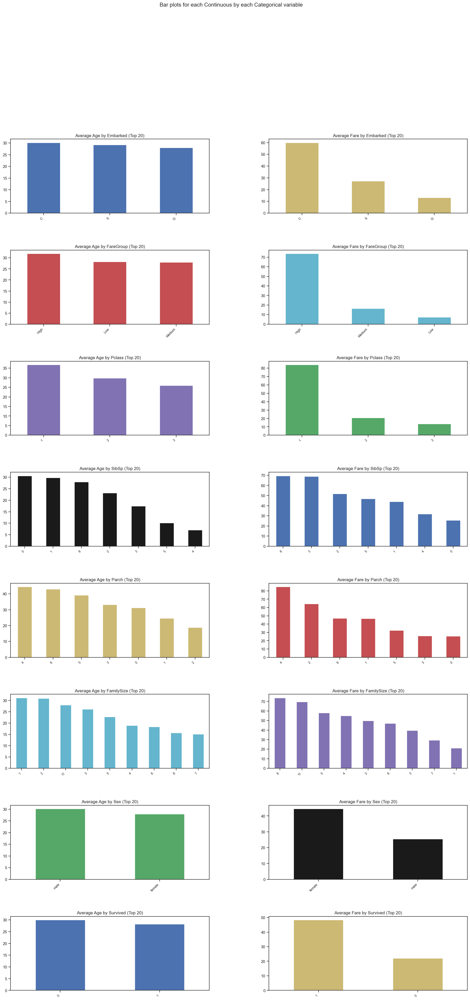

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     /Users/vinsss/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     /Users/vinsss/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     /Users/vinsss/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     /Users/vinsss/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     /Users/vinsss/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /Users/vinsss/nltk_data...
[nltk_data]    |   Package movie_reviews is already

Could not draw wordcloud plot for Name. 
Looks like you are missing some required data for this feature.

To download the necessary data, simply run

    python -m textblob.download_corpora

or use the NLTK downloader to download the missing data: http://nltk.org/data.html
If this doesn't fix the problem, file an issue at https://github.com/sloria/TextBlob/issues.

Could not draw wordcloud plot for Ticket. 
Looks like you are missing some required data for this feature.

To download the necessary data, simply run

    python -m textblob.download_corpora

or use the NLTK downloader to download the missing data: http://nltk.org/data.html
If this doesn't fix the problem, file an issue at https://github.com/sloria/TextBlob/issues.

All Plots done
Time to run AutoViz = 3 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


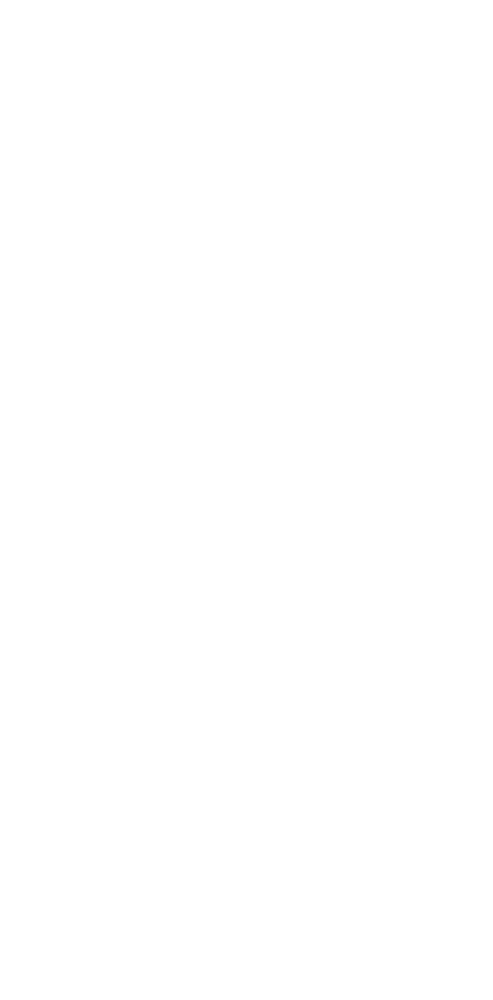

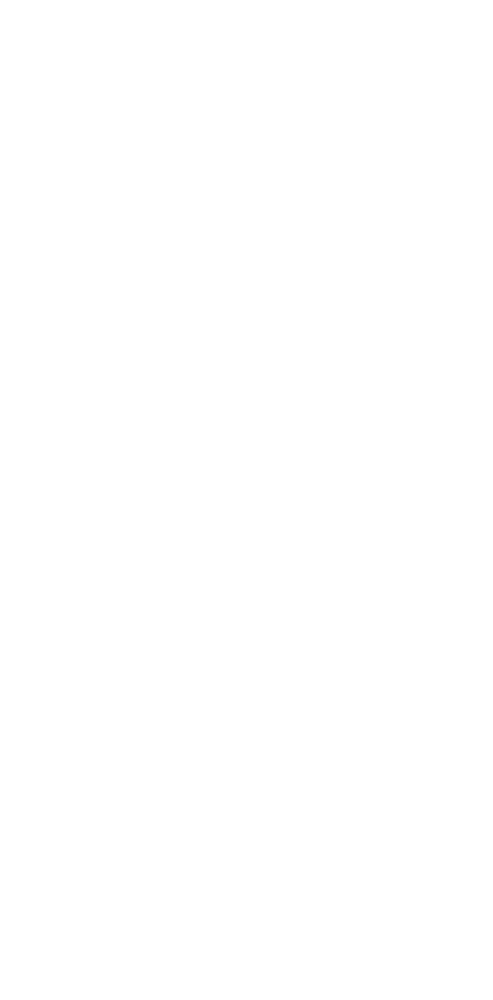

In [32]:
AV = AutoViz_Class()
df_av = AV.AutoViz(filename="", dfte=df, depVar='Survived')